In [1]:
import numpy as np
import matplotlib
import mne
import pandas as pd

In [2]:
import os
import pywt
import numpy as np
import pandas as pd
from mne.io import read_raw_fif
from mne import create_info
from mne.io import RawArray
from mne.epochs import Epochs
from mne.time_frequency import tfr_morlet
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
import re
import os
from mne import create_info, concatenate_raws, make_fixed_length_epochs

In [3]:
# for band_folder in ['delta_band_model', 'theta_band_model', 'alpha_band_model', 'beta_band_model', 'gamma_band_model']:
#     if not os.path.exists(band_folder):
#         folder =os.path.join("R:\dens\VA\svm_model_mobilenet",band_folder)
#         os.makedirs(folder)

In [4]:
# # 22,69,66,46,107
# for band_folder in ['21','22','32','23','10','27','12','44','35','46','36','57','51','66','69','8','2','121','123','116','111','107','103','97','86','95','91','61','76','82','74']:
# # for band_folder in ['22','69','66','46','107']:
#     if not os.path.exists(band_folder):
#         folder =os.path.join("R:\dens\VA\svm_model_resnet\\arousal",band_folder)
#         os.makedirs(folder)

In [5]:
# Define function to determine label based on valence
def determine_label(arousal):
    return 'HA' if arousal > 5 else 'LA'

In [6]:
# Function to perform wavelet decomposition and extract EEG rhythms
def extract_eeg_rhythms(eeg_data, channel_name,band_name):
    # Define wavelet parameters
    wavelet = 'db4'  # Daubechies 4th order wavelet
    levels = 6

    # Perform wavelet decomposition
    coeffs = pywt.wavedec(eeg_data, wavelet, level=levels)
    
    rhythm = coeffs[levels]
    
    return rhythm

In [8]:
def apply_continuous_wavelet_transform_to_raw(raw_data, frequencies, sfreq):
    # Create info object for a single-channel EEG signal
    info = mne.create_info(ch_names=['channel1'], sfreq=sfreq, ch_types='eeg')
#     print(info)
    # Reshape raw_data to a 2D array
    raw_data_2d = raw_data.reshape(1, -1)

    # Create RawArray object from the raw data and info
    raw_array = mne.io.RawArray(raw_data_2d, info)
#     print(raw_array.get_data())
    # Create an Epochs object from the RawArray
    events = np.array([[0, 0, 1]])  # Dummy event
    epochs = mne.EpochsArray([raw_data_2d], info, events=events, tmin=0)

    # Apply continuous wavelet transform to epochs
    tfr = mne.time_frequency.tfr_morlet(epochs, freqs=frequencies, n_cycles=frequencies / 2.0, return_itc=False, average=False)
    print(tfr.data.shape)
    return tfr

In [9]:
channels_list = [f'{i+1}' for i in range(128)]

In [10]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt

def convert_tfr_to_images(tfr, labels, channel_names):

    if tfr.data.shape[0] > 0:
        power_data = tfr.data[0, :, :, :]
        power_data_normalized = 10 * np.log10(power_data)
        
        # Normalize the image data
        normalized_image = (power_data_normalized - np.min(power_data_normalized)) / np.ptp(power_data_normalized) * 255.0
        normalized_image_uint8 = normalized_image.astype(np.uint8)
#         print(normalized_image_uint8[0])
        # Resize the image to 224x224 RGB format
        resized_images = []
        for img in normalized_image_uint8:
            img_reshaped = np.repeat(img[:, :, np.newaxis], 3, axis=2)  # Convert to 224x224x3 RGB format
            img_pil = Image.fromarray(img_reshaped)
            resized_images.append(img_pil.resize((224, 224)))
            
        return resized_images
    else :
        return False 
    


In [12]:
# Define function to load and preprocess an image
def load_and_preprocess_image(img_path):
#     img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img_path)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
#     print(img_array)
    return img_array

# Define function to extract deep features using a pre-trained model
def extract_deep_features(model, img_path):
    img_array = load_and_preprocess_image(img_path)
    features = model.predict(img_array)
    return features.flatten()

In [13]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.optimizers import Adam
import scipy
# Define channels
channels = [21,22,32,23,10,27,12,44,35,46,36,57,51,66,69,8,2,121,123,116,111,107,103,97,86,95,91,61,76,82,74]
rhythm_frequencies = np.arange(1, 41, 1)
# Load CSV file
csv_path = 'R:/EEG_Data/cleaned_data_readings_arousal.csv'
data = pd.read_csv(csv_path)


# Initialize empty DataFrame to store labels
labels_df = pd.DataFrame(columns=['file_name', 'channel', 'label'])


image =[]
lab = []

# Loop through each row in the CSV file
for index, row in tqdm(data.iterrows(), total=len(data), desc='Processing EEG files'):
    file_name = row['file_name']
    valence = row['rating_valence']
    arousal = row['arousal']
    
    labels = determine_label(arousal)

    # Form the EEG file path
    eeg_file_path = os.path.join('R:\\EEG_Data\\data', f"{file_name}")

    # Load EEG data (replace this with your actual EEG data loading code)
    raw = scipy.io.loadmat(eeg_file_path)
#     print(raw['data'])
    eeg_data = []
    for i in channels:

        eeg_data.append(raw['data'][i])

    # For each channel, extract rhythms for each band
    for idx , channel in enumerate(channels):
        for band_name, frequencies in zip(['rhythm'],
                                          [ rhythm_frequencies
                                          ]):

            # Extract rhythms for each band (replace this with your actual rhythm extraction code)
            rhythms = extract_eeg_rhythms(eeg_data[idx], frequencies,band_name)
#             print(rhythms)
            # Label rhythms based on valence
            rhythm_labels = labels
            lab.append(labels)
            # Convert rhythms to time-frequency representation  (rhythms, frequencies, sfreq, file, channel_names)
            tfr = apply_continuous_wavelet_transform_to_raw(eeg_data[idx],frequencies, 250)
#             print(tfr.data)
#             Convert TFR to images  (tfrs, save_path, labels, channel_names)
            images = convert_tfr_to_images(tfr,labels,channel)
            image.append(images)


Processing EEG files:   0%|          | 0/216 [00:00<?, ?it/s]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   1%|          | 2/216 [00:01<03:17,  1.08it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   1%|▏         | 3/216 [00:03<03:41,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   2%|▏         | 4/216 [00:04<03:53,  1.10s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   2%|▏         | 5/216 [00:05<03:50,  1.09s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   3%|▎         | 6/216 [00:06<03:41,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   3%|▎         | 7/216 [00:07<03:36,  1.03s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   4%|▎         | 8/216 [00:08<03:33,  1.03s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   4%|▍         | 9/216 [00:09<03:27,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   5%|▍         | 10/216 [00:10<03:28,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   6%|▌         | 12/216 [00:12<03:22,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   6%|▌         | 13/216 [00:13<03:20,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   8%|▊         | 17/216 [00:16<03:00,  1.10it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   8%|▊         | 18/216 [00:17<02:58,  1.11it/s]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   9%|▉         | 19/216 [00:18<03:01,  1.08it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  10%|▉         | 21/216 [00:20<02:56,  1.10it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  12%|█▏        | 26/216 [00:24<02:45,  1.15it/s]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  13%|█▎        | 29/216 [00:27<02:47,  1.12it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  14%|█▍        | 30/216 [00:28<02:49,  1.10it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  14%|█▍        | 31/216 [00:29<02:44,  1.12it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  17%|█▋        | 37/216 [00:34<02:36,  1.14it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  18%|█▊        | 38/216 [00:35<02:42,  1.10it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  18%|█▊        | 39/216 [00:36<02:41,  1.10it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  19%|█▊        | 40/216 [00:37<02:46,  1.06it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  19%|█▉        | 42/216 [00:39<02:49,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  20%|██        | 44/216 [00:41<02:42,  1.06it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  21%|██        | 45/216 [00:42<02:46,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  25%|██▌       | 54/216 [00:49<02:20,  1.15it/s]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  25%|██▌       | 55/216 [00:50<02:27,  1.09it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  26%|██▋       | 57/216 [00:52<02:22,  1.12it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  27%|██▋       | 59/216 [00:54<02:18,  1.14it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)


Processing EEG files:  28%|██▊       | 60/216 [00:55<02:18,  1.13it/s]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  28%|██▊       | 61/216 [00:56<02:23,  1.08it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  29%|██▊       | 62/216 [00:57<02:27,  1.04it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  29%|██▉       | 63/216 [00:58<02:28,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  30%|██▉       | 64/216 [00:59<02:27,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  30%|███       | 65/216 [01:00<02:26,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  31%|███       | 66/216 [01:01<02:23,  1.05it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  31%|███       | 67/216 [01:02<02:24,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  31%|███▏      | 68/216 [01:03<02:21,  1.05it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  33%|███▎      | 71/216 [01:05<02:16,  1.06it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  33%|███▎      | 72/216 [01:06<02:19,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  34%|███▍      | 73/216 [01:07<02:21,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  34%|███▍      | 74/216 [01:08<02:19,  1.02it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  37%|███▋      | 80/216 [01:13<01:55,  1.18it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  38%|███▊      | 81/216 [01:14<01:53,  1.19it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  38%|███▊      | 82/216 [01:15<01:50,  1.21it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  38%|███▊      | 83/216 [01:16<01:48,  1.22it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  42%|████▏     | 91/216 [01:23<01:49,  1.15it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  43%|████▎     | 93/216 [01:24<01:44,  1.17it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  44%|████▍     | 96/216 [01:27<01:55,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  46%|████▌     | 99/216 [01:30<01:43,  1.13it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  47%|████▋     | 102/216 [01:33<01:41,  1.12it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  48%|████▊     | 103/216 [01:34<01:44,  1.08it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  49%|████▉     | 106/216 [01:36<01:37,  1.13it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  50%|████▉     | 107/216 [01:37<01:47,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  50%|█████     | 108/216 [01:39<01:52,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  50%|█████     | 109/216 [01:40<01:55,  1.08s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  51%|█████     | 110/216 [01:41<01:57,  1.11s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  51%|█████▏    | 111/216 [01:42<01:58,  1.13s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  52%|█████▏    | 112/216 [01:43<01:53,  1.09s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  52%|█████▏    | 113/216 [01:44<01:49,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  53%|█████▎    | 114/216 [01:45<01:46,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  53%|█████▎    | 115/216 [01:46<01:42,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  54%|█████▎    | 116/216 [01:47<01:40,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  54%|█████▍    | 117/216 [01:48<01:39,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  55%|█████▍    | 118/216 [01:49<01:38,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  55%|█████▌    | 119/216 [01:50<01:37,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  56%|█████▌    | 120/216 [01:51<01:36,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  56%|█████▌    | 121/216 [01:52<01:34,  1.00it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  56%|█████▋    | 122/216 [01:53<01:33,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  57%|█████▋    | 123/216 [01:54<01:34,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  57%|█████▋    | 124/216 [01:55<01:37,  1.06s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  58%|█████▊    | 125/216 [01:56<01:34,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  58%|█████▊    | 126/216 [01:57<01:36,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  59%|█████▉    | 127/216 [01:58<01:37,  1.10s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  59%|█████▉    | 128/216 [01:59<01:34,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  60%|█████▉    | 129/216 [02:00<01:28,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  60%|██████    | 130/216 [02:02<01:31,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  61%|██████    | 131/216 [02:03<01:34,  1.11s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  61%|██████    | 132/216 [02:04<01:30,  1.08s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  62%|██████▏   | 133/216 [02:05<01:27,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  62%|██████▏   | 134/216 [02:06<01:25,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  62%|██████▎   | 135/216 [02:07<01:23,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  64%|██████▍   | 138/216 [02:10<01:24,  1.08s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  64%|██████▍   | 139/216 [02:11<01:24,  1.10s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  65%|██████▍   | 140/216 [02:12<01:21,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  66%|██████▌   | 143/216 [02:15<01:18,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  67%|██████▋   | 144/216 [02:17<01:19,  1.11s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  67%|██████▋   | 145/216 [02:18<01:18,  1.10s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  68%|██████▊   | 146/216 [02:19<01:18,  1.12s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  68%|██████▊   | 147/216 [02:20<01:20,  1.17s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  69%|██████▊   | 148/216 [02:21<01:18,  1.16s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  69%|██████▉   | 149/216 [02:22<01:17,  1.15s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  69%|██████▉   | 150/216 [02:23<01:14,  1.13s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  70%|██████▉   | 151/216 [02:25<01:14,  1.15s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  70%|███████   | 152/216 [02:26<01:15,  1.18s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  71%|███████   | 153/216 [02:27<01:15,  1.20s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  71%|███████▏  | 154/216 [02:28<01:11,  1.15s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  72%|███████▏  | 155/216 [02:29<01:07,  1.11s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  72%|███████▏  | 156/216 [02:30<01:04,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  73%|███████▎  | 157/216 [02:31<01:02,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  73%|███████▎  | 158/216 [02:32<01:02,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  74%|███████▎  | 159/216 [02:33<01:00,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  75%|███████▍  | 161/216 [02:35<00:56,  1.03s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  75%|███████▌  | 162/216 [02:36<00:55,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  75%|███████▌  | 163/216 [02:37<00:54,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  76%|███████▌  | 164/216 [02:38<00:53,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  76%|███████▋  | 165/216 [02:40<00:54,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  77%|███████▋  | 166/216 [02:41<00:53,  1.08s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  77%|███████▋  | 167/216 [02:42<00:54,  1.12s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  78%|███████▊  | 168/216 [02:43<00:52,  1.09s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  78%|███████▊  | 169/216 [02:44<00:50,  1.08s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  79%|███████▊  | 170/216 [02:45<00:48,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  79%|███████▉  | 171/216 [02:46<00:47,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  80%|███████▉  | 172/216 [02:47<00:46,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  80%|████████  | 173/216 [02:48<00:43,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  81%|████████  | 174/216 [02:49<00:42,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  82%|████████▏ | 177/216 [02:52<00:37,  1.05it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  82%|████████▏ | 178/216 [02:53<00:36,  1.04it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  83%|████████▎ | 180/216 [02:55<00:35,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  84%|████████▍ | 181/216 [02:56<00:35,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  84%|████████▍ | 182/216 [02:57<00:34,  1.01s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  85%|████████▍ | 183/216 [02:58<00:34,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  85%|████████▌ | 184/216 [02:59<00:34,  1.09s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  86%|████████▌ | 185/216 [03:00<00:33,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  86%|████████▌ | 186/216 [03:01<00:31,  1.06s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  88%|████████▊ | 190/216 [03:05<00:27,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  88%|████████▊ | 191/216 [03:06<00:26,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  89%|████████▉ | 192/216 [03:08<00:25,  1.05s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Ran

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  90%|████████▉ | 194/216 [03:10<00:22,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  90%|█████████ | 195/216 [03:11<00:21,  1.04s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  91%|█████████ | 196/216 [03:12<00:20,  1.04s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  92%|█████████▏| 198/216 [03:14<00:19,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  92%|█████████▏| 199/216 [03:15<00:18,  1.09s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  93%|█████████▎| 200/216 [03:16<00:17,  1.09s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  93%|█████████▎| 201/216 [03:17<00:16,  1.07s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  94%|█████████▎| 202/216 [03:18<00:14,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  94%|█████████▍| 203/216 [03:19<00:13,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  94%|█████████▍| 204/216 [03:20<00:12,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  95%|█████████▍| 205/216 [03:21<00:11,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  95%|█████████▌| 206/216 [03:22<00:10,  1.02s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  96%|█████████▌| 207/216 [03:23<00:08,  1.01it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  96%|█████████▋| 208/216 [03:24<00:07,  1.04it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  97%|█████████▋| 209/216 [03:25<00:06,  1.03it/s]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  97%|█████████▋| 210/216 [03:26<00:06,  1.00s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  98%|█████████▊| 212/216 [03:28<00:04,  1.01s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_chan

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:  99%|█████████▉| 214/216 [03:30<00:02,  1.06s/it]

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matchi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No ba

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files: 100%|██████████| 216/216 [03:32<00:00,  1.01it/s]

(1, 1, 40, 1751)


In [14]:
len(lab)

6696

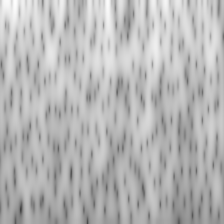

In [18]:
len(image[0])
image[0][0]

In [30]:
images_array = np.array([np.array(img[0]) for img in image])
images_array.shape

(2090, 224, 224, 3)

In [15]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Reshape
from sklearn.preprocessing import LabelEncoder

# Constants
number_of_classes = 150528  # Number of pixels in 224x224x3 image
batch_size = 32  # Adjust this according to your system's capability
image_size = (224, 224, 3)

# Load MobileNetV2 as the base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
images_array = np.array([np.array(img[0]) for img in image])
# Freeze the base model
base_model.trainable = False

# # Create the custom head for our network
# x = base_model.output
# x = GlobalAveragePooling2D()(x)
# x = Flatten()(x)  # Flatten layer to match input and output shapes
# x = Dense(512, activation='relu')(x)  # Add a dense layer for dimensionality reduction
# x = Dense(150528, activation='sigmoid')(x)
# # predictions = Dense(number_of_classes, activation='softmax')(x)  # Final output layer

# # Construct the full model
# # model = Model(inputs=base_model.input, outputs=predictions)
# model = Model(inputs=base_model.input, outputs=x)
# # Compile the model
# # model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
# model.compile(optimizer=Adam(lr=0.001), loss='mean_squared_error', metrics=['accuracy'])
# # Assuming images_array contains preprocessed images
# history = model.fit(images_array, images_array, epochs=50)


base_model_input = GlobalAveragePooling2D()(base_model.output)
custom_input = Dense(512, activation='relu')(base_model_input)


custom_output = Dense(150528, activation='sigmoid')(custom_input)
model_output = Reshape((224, 224, 3))(custom_output)

# Construct the full model
model = Model(inputs=base_model.input, outputs=model_output)

# Compile the model
model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fit the model
history = model.fit(images_array, images_array, epochs=10, batch_size=batch_size)


Epoch 1/10
210/210 [==============================] - 718s 3s/step - loss: 589.9241 - accuracy: 0.3623
Epoch 2/10
210/210 [==============================] - 903s 4s/step - loss: 589.9210 - accuracy: 0.7845
Epoch 3/10
210/210 [==============================] - 940s 4s/step - loss: 589.9211 - accuracy: 0.7799
Epoch 4/10
210/210 [==============================] - 939s 4s/step - loss: 589.9213 - accuracy: 0.7677
Epoch 5/10
210/210 [==============================] - 946s 5s/step - loss: 589.9213 - accuracy: 0.7588
Epoch 6/10
210/210 [==============================] - 1032s 5s/step - loss: 589.9211 - accuracy: 0.7511
Epoch 7/10
210/210 [==============================] - 1330s 6s/step - loss: 589.9212 - accuracy: 0.7438
Epoch 8/10
210/210 [==============================] - 1075s 5s/step - loss: 589.9210 - accuracy: 0.7365
Epoch 9/10
210/210 [==============================] - 1033s 5s/step - loss: 589.9211 - accuracy: 0.7294
Epoch 10/10
210/210 [==============================] - 1057s 5s/step 

In [1]:
model.save('R:\\dens\\VA\\svm_model_resnet\\rhythm_band_model\\my_model_arousal.h5')

In [55]:
# images_array.shape

(12958, 224, 224, 3)

In [2]:
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# # Make predictions
# y_pred = model.predict(validation_generator)
# y_pred_classes = np.argmax(y_pred, axis=1)
# y_true = validation_generator.classes

# # Calculate metrics
# accuracy = accuracy_score(y_true, y_pred_classes)
# report = classification_report(y_true, y_pred_classes)
# conf_matrix = confusion_matrix(y_true, y_pred_classes)

# # Print metrics
# print("Accuracy:", accuracy)
# print("Classification Report:")
# print(report)
# print("Confusion Matrix:")
# print(conf_matrix)

In [3]:
# import matplotlib.pyplot as plt

# # Plot training & validation loss values
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('Model loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train', 'Validation'], loc='upper left')
# plt.show()

In [17]:
import os
import numpy as np
import pandas as pd
from mne import EpochsArray, create_info
from scipy import signal
from scipy.io import savemat
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tqdm import tqdm
import scipy

# Define frequencies for each EEG rhythm band
# delta_frequencies = np.arange(0.1, 4.1, 1)
# theta_frequencies = np.arange(4, 8.1, 1)
# alpha_frequencies = np.arange(8, 14.1, 1)
# beta_frequencies = np.arange(14, 30.1, 1)
# gamma_frequencies = np.arange(30, 61, 1)
rhythm_frequencies = np.arange(1, 41, 1)


# Define channels
channels = [21,22,32,23,10,27,12,44,35,46,36,57,51,66,69,8,2,121,123,116,111,107,103,97,86,95,91,61,76,82,74]

# Load CSV file
csv_path = 'R:/EEG_Data/cleaned_data_readings_arousal.csv'
data = pd.read_csv(csv_path)


# Initialize empty DataFrame to store labels
labels_df = pd.DataFrame(columns=['file_name', 'channel', 'label'])


# image =[]


# Loop through each row in the CSV file
for index, row in tqdm(data.iterrows(), total=len(data), desc='Processing EEG files'):
    file_name = row['file_name']
    valence = row['rating_valence']
    arousal = row['arousal']
    
    labels = determine_label(arousal)

    # Form the EEG file path
    eeg_file_path = os.path.join('R:\\EEG_Data\\data', f"{file_name}")

    # Load EEG data (replace this with your actual EEG data loading code)
    raw = scipy.io.loadmat(eeg_file_path)
#     print(raw['data'])
    eeg_data = []
    for i in channels:

        eeg_data.append(raw['data'][i])

    # For each channel, extract rhythms for each band
    for idx , channel in enumerate(channels):
        for band_name, frequencies in zip(['rhythm'],
                                          [ rhythm_frequencies
                                          ]):

            # Extract rhythms for each band (replace this with your actual rhythm extraction code)
            rhythms = extract_eeg_rhythms(eeg_data[idx], frequencies,band_name)
#             print(rhythms)
            # Label rhythms based on valence
            rhythm_labels = labels
            
            # Convert rhythms to time-frequency representation  (rhythms, frequencies, sfreq, file, channel_names)
            tfr = apply_continuous_wavelet_transform_to_raw(eeg_data[idx],frequencies, 250)
#             print(tfr.data)
#             Convert TFR to images  (tfrs, save_path, labels, channel_names)
            images = convert_tfr_to_images(tfr,labels,channel)
#             image.append(images)
# # #             print(images[0].shape)

#             if images:
            
#             mobilenet_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#             for layer in mobilenet_model.layers:
#                 layer.trainable = False
            for layer in model.layers:
                layer.trainable = False

            # Extract deep features using VGG16
            deep_features = extract_deep_features(model, images[0])
           
            features_directory = f'R:\dens\VA\svm_model_resnet\\arousal\\{channel}'
            # Save the features as a NumPy array for the current band
            features_path = os.path.join(features_directory, f"ResNet50_{file_name}_label_{labels}.npy")
            np.save(features_path, deep_features)

            


Processing EEG files:   0%|          | 0/216 [00:00<?, ?it/s]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 1s 981ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 120ms/step


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 113ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 119ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 117ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 118ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 111ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 117ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 129ms/step


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 168ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step


Processing EEG files:   0%|          | 1/216 [00:09<35:00,  9.77s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 170ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 171ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 124ms/step


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 112ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 116ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 112ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 115ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 113ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 119ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 116ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 113ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 119ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 118ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 113ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 116ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 122ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 118ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 127ms/step


Processing EEG files:   1%|          | 2/216 [00:17<30:23,  8.52s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 125ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 119ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 111ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 117ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 125ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 110ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 119ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 121ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 121ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 168ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 122ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 110ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 115ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 122ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 116ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 118ms/step


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Processing EEG files:   1%|▏         | 3/216 [00:24<27:53,  7.86s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 116ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 115ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 125ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 111ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 120ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 110ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 122ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 127ms/step


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 122ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 161ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step


Processing EEG files:   2%|▏         | 4/216 [00:33<29:34,  8.37s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 302ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 331ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 320ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 309ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step


Processing EEG files:   2%|▏         | 5/216 [00:46<35:03,  9.97s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 335ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step


Processing EEG files:   3%|▎         | 6/216 [00:57<36:00, 10.29s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step


Processing EEG files:   3%|▎         | 7/216 [01:07<35:58, 10.33s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step


Processing EEG files:   4%|▎         | 8/216 [01:18<36:08, 10.42s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step


Processing EEG files:   4%|▍         | 9/216 [01:28<35:44, 10.36s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 297ms/step


Processing EEG files:   5%|▍         | 10/216 [01:38<34:38, 10.09s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 319ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 121ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step


Processing EEG files:   5%|▌         | 11/216 [01:47<33:47,  9.89s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step


Processing EEG files:   6%|▌         | 12/216 [01:56<32:18,  9.50s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 168ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step


Processing EEG files:   6%|▌         | 13/216 [02:05<32:11,  9.52s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 171ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 344ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 345ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step


Processing EEG files:   6%|▋         | 14/216 [02:16<33:33,  9.97s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step


Processing EEG files:   7%|▋         | 15/216 [02:27<34:24, 10.27s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step


Processing EEG files:   7%|▋         | 16/216 [02:39<35:30, 10.65s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step


Processing EEG files:   8%|▊         | 17/216 [02:50<35:52, 10.82s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step


Processing EEG files:   8%|▊         | 18/216 [03:02<36:47, 11.15s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step


Processing EEG files:   9%|▉         | 19/216 [03:13<36:31, 11.12s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step


Processing EEG files:   9%|▉         | 20/216 [03:22<34:39, 10.61s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 159ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 164ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 168ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 164ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step


Processing EEG files:  10%|▉         | 21/216 [03:31<33:05, 10.18s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step


Processing EEG files:  10%|█         | 22/216 [03:43<33:54, 10.49s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step


Processing EEG files:  11%|█         | 23/216 [03:53<33:59, 10.57s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step


Processing EEG files:  11%|█         | 24/216 [04:04<33:55, 10.60s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step


Processing EEG files:  12%|█▏        | 25/216 [04:15<33:56, 10.66s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step


Processing EEG files:  12%|█▏        | 26/216 [04:25<33:29, 10.57s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step


Processing EEG files:  12%|█▎        | 27/216 [04:34<31:27,  9.99s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step


Processing EEG files:  13%|█▎        | 28/216 [04:42<29:37,  9.45s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 159ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 159ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step


Processing EEG files:  13%|█▎        | 29/216 [04:51<28:27,  9.13s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step


Processing EEG files:  14%|█▍        | 30/216 [04:59<27:25,  8.85s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step


Processing EEG files:  14%|█▍        | 31/216 [05:07<26:48,  8.70s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 164ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step


Processing EEG files:  15%|█▍        | 32/216 [05:15<26:16,  8.57s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 125ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 124ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step


Processing EEG files:  15%|█▌        | 33/216 [05:24<26:32,  8.70s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step


Processing EEG files:  16%|█▌        | 34/216 [05:32<25:42,  8.48s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step


Processing EEG files:  16%|█▌        | 35/216 [05:40<25:14,  8.37s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 125ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 125ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step


Processing EEG files:  17%|█▋        | 36/216 [05:48<24:46,  8.26s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 119ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step


Processing EEG files:  17%|█▋        | 37/216 [05:56<24:18,  8.15s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 170ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step


Processing EEG files:  18%|█▊        | 38/216 [06:05<24:41,  8.32s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step


Processing EEG files:  18%|█▊        | 39/216 [06:14<24:42,  8.38s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step


Processing EEG files:  19%|█▊        | 40/216 [06:22<24:38,  8.40s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 161ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step


Processing EEG files:  19%|█▉        | 41/216 [06:31<24:50,  8.52s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 164ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step


Processing EEG files:  19%|█▉        | 42/216 [06:41<25:50,  8.91s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 126ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step


Processing EEG files:  20%|█▉        | 43/216 [06:49<24:53,  8.63s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 128ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 130ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 133ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 139ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 141ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - 0s 122ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 140ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 135ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 138ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 132ms/step


Processing EEG files:  20%|██        | 44/216 [06:57<24:10,  8.43s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 137ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 131ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 155ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 129ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 136ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 154ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)
1/1 [==============================] - ETA: 0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 127ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 171ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 168ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step


Processing EEG files:  21%|██        | 45/216 [07:06<24:43,  8.68s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step


Processing EEG files:  21%|██▏       | 46/216 [07:16<26:14,  9.26s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step


Processing EEG files:  22%|██▏       | 47/216 [07:27<26:59,  9.58s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 173ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 171ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step


Processing EEG files:  22%|██▏       | 48/216 [07:37<27:26,  9.80s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step


Processing EEG files:  23%|██▎       | 49/216 [07:47<27:34,  9.91s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 197ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step


Processing EEG files:  23%|██▎       | 50/216 [07:57<27:40, 10.00s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 189ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 142ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 148ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 134ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 149ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 170ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 159ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step


Processing EEG files:  24%|██▎       | 51/216 [08:06<26:29,  9.63s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 146ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 147ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 151ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 171ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 161ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 166ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 169ms/step


Processing EEG files:  24%|██▍       | 52/216 [08:15<25:52,  9.47s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 158ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 156ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 145ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 144ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 159ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 161ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step


Processing EEG files:  25%|██▍       | 53/216 [08:25<25:51,  9.52s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 167ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 163ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 165ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 152ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step


Processing EEG files:  25%|██▌       | 54/216 [08:35<25:56,  9.61s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 150ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 164ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 162ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 143ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 181ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 179ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 186ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 183ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step


Processing EEG files:  25%|██▌       | 55/216 [08:45<26:11,  9.76s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 178ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 160ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 176ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 157ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 174ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 177ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 193ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 153ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 172ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 180ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 175ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 190ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 184ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 192ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 307ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step


Processing EEG files:  26%|██▌       | 56/216 [08:55<26:26,  9.91s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 194ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 331ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 201ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 200ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 296ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 321ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 303ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step


Processing EEG files:  26%|██▋       | 57/216 [09:08<28:21, 10.70s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 308ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 182ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 199ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 195ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 185ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 198ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 188ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 187ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 191ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 196ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step


Processing EEG files:  27%|██▋       | 58/216 [09:19<28:38, 10.88s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 205ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step


Processing EEG files:  27%|██▋       | 59/216 [09:30<28:54, 11.05s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 313ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 202ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 203ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 204ms/step


Processing EEG files:  28%|██▊       | 60/216 [09:42<29:11, 11.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 209ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 206ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 299ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step


Processing EEG files:  28%|██▊       | 61/216 [09:54<29:47, 11.53s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 326ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 315ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 211ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 350ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 305ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 373ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 340ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 314ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 298ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step


Processing EEG files:  29%|██▊       | 62/216 [10:07<30:53, 12.03s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 351ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 315ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 301ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 325ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 332ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 292ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step


Processing EEG files:  29%|██▉       | 63/216 [10:22<32:17, 12.66s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step


Processing EEG files:  30%|██▉       | 64/216 [10:35<32:39, 12.89s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step


Processing EEG files:  30%|███       | 65/216 [10:49<33:02, 13.13s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 308ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step


Processing EEG files:  31%|███       | 66/216 [11:02<33:05, 13.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 298ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step


Processing EEG files:  31%|███       | 67/216 [11:16<33:03, 13.31s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 299ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 298ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step


Processing EEG files:  31%|███▏      | 68/216 [11:29<33:06, 13.43s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 292ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step


Processing EEG files:  32%|███▏      | 69/216 [11:43<33:01, 13.48s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 303ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step


Processing EEG files:  32%|███▏      | 70/216 [11:57<32:55, 13.53s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step


Processing EEG files:  33%|███▎      | 71/216 [12:10<32:46, 13.56s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 306ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 312ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 324ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 307ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 303ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 332ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step


Processing EEG files:  33%|███▎      | 72/216 [12:25<33:09, 13.81s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 300ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step


Processing EEG files:  34%|███▍      | 73/216 [12:38<32:27, 13.62s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 294ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step


Processing EEG files:  34%|███▍      | 74/216 [12:51<31:53, 13.48s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 300ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step


Processing EEG files:  35%|███▍      | 75/216 [13:04<31:16, 13.31s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 290ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step


Processing EEG files:  35%|███▌      | 76/216 [13:17<30:55, 13.25s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 332ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 294ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step


Processing EEG files:  36%|███▌      | 77/216 [13:30<30:39, 13.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step


Processing EEG files:  36%|███▌      | 78/216 [13:43<30:12, 13.13s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 292ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step


Processing EEG files:  37%|███▋      | 79/216 [13:56<29:55, 13.11s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step


Processing EEG files:  37%|███▋      | 80/216 [14:09<29:48, 13.15s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step


Processing EEG files:  38%|███▊      | 81/216 [14:23<29:41, 13.20s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step


Processing EEG files:  38%|███▊      | 82/216 [14:36<29:21, 13.14s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 294ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 315ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 297ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 307ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 337ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 350ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 302ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 290ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step


Processing EEG files:  38%|███▊      | 83/216 [14:50<29:51, 13.47s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 332ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 320ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 327ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 311ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 310ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step


Processing EEG files:  39%|███▉      | 84/216 [15:03<29:38, 13.48s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step


Processing EEG files:  39%|███▉      | 85/216 [15:16<28:35, 13.09s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 307ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step


Processing EEG files:  40%|███▉      | 86/216 [15:28<27:58, 12.91s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 171ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 210ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step


Processing EEG files:  40%|████      | 87/216 [15:40<27:04, 12.59s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 208ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step


Processing EEG files:  41%|████      | 88/216 [15:52<26:18, 12.33s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step


Processing EEG files:  41%|████      | 89/216 [16:04<26:07, 12.34s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step


Processing EEG files:  42%|████▏     | 90/216 [16:16<25:44, 12.26s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 216ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step


Processing EEG files:  42%|████▏     | 91/216 [16:28<25:26, 12.21s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 215ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 212ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step


Processing EEG files:  43%|████▎     | 92/216 [16:40<24:59, 12.09s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step


Processing EEG files:  43%|████▎     | 93/216 [16:52<24:51, 12.13s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step


Processing EEG files:  44%|████▎     | 94/216 [17:04<24:32, 12.07s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 207ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 214ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 213ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step


Processing EEG files:  44%|████▍     | 95/216 [17:16<24:11, 11.99s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 219ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step


Processing EEG files:  44%|████▍     | 96/216 [17:28<23:56, 11.97s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 296ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 325ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 305ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 290ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 325ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 327ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 320ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 337ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step


Processing EEG files:  45%|████▍     | 97/216 [17:42<25:05, 12.65s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step


Processing EEG files:  45%|████▌     | 98/216 [17:55<25:02, 12.74s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 225ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step


Processing EEG files:  46%|████▌     | 99/216 [18:08<24:49, 12.73s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 221ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 220ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 217ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 223ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step


Processing EEG files:  46%|████▋     | 100/216 [18:20<24:20, 12.59s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 224ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step


Processing EEG files:  47%|████▋     | 101/216 [18:32<23:56, 12.49s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 297ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 323ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step


Processing EEG files:  47%|████▋     | 102/216 [18:45<23:47, 12.52s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step


Processing EEG files:  48%|████▊     | 103/216 [18:57<23:33, 12.51s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step


Processing EEG files:  48%|████▊     | 104/216 [19:10<23:35, 12.64s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 316ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 227ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 301ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step


Processing EEG files:  49%|████▊     | 105/216 [19:23<23:31, 12.71s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 296ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step


Processing EEG files:  49%|████▉     | 106/216 [19:36<23:17, 12.70s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step


Processing EEG files:  50%|████▉     | 107/216 [19:49<23:08, 12.74s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 324ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step


Processing EEG files:  50%|█████     | 108/216 [20:02<23:03, 12.81s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 308ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 292ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step


Processing EEG files:  50%|█████     | 109/216 [20:15<22:51, 12.82s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step


Processing EEG files:  51%|█████     | 110/216 [20:27<22:34, 12.78s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 292ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 293ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 318ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 299ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 369ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 325ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 307ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 297ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step


Processing EEG files:  51%|█████▏    | 111/216 [20:42<23:07, 13.22s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 298ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step


Processing EEG files:  52%|█████▏    | 112/216 [20:54<22:23, 12.92s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 222ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step


Processing EEG files:  52%|█████▏    | 113/216 [21:06<21:49, 12.71s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 229ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step


Processing EEG files:  53%|█████▎    | 114/216 [21:18<21:15, 12.50s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 230ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 231ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 236ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 228ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step


Processing EEG files:  53%|█████▎    | 115/216 [21:30<20:52, 12.41s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 301ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 226ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 233ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step


Processing EEG files:  54%|█████▎    | 116/216 [21:43<20:38, 12.39s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 232ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 234ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 238ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 235ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step


Processing EEG files:  54%|█████▍    | 117/216 [21:55<20:34, 12.47s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 286ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 278ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 290ms/step


Processing EEG files:  55%|█████▍    | 118/216 [22:08<20:41, 12.67s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 309ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 373ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 305ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 304ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 237ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 277ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step


Processing EEG files:  55%|█████▌    | 119/216 [22:21<20:33, 12.71s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 281ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step


Processing EEG files:  56%|█████▌    | 120/216 [22:34<20:16, 12.68s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 240ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step


Processing EEG files:  56%|█████▌    | 121/216 [22:46<19:55, 12.58s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 241ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step


Processing EEG files:  56%|█████▋    | 122/216 [22:59<19:53, 12.70s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 242ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 294ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 243ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step


Processing EEG files:  57%|█████▋    | 123/216 [23:12<19:44, 12.74s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 245ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 283ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 279ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step


Processing EEG files:  57%|█████▋    | 124/216 [23:25<19:39, 12.82s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 246ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step


Processing EEG files:  58%|█████▊    | 125/216 [23:38<19:24, 12.80s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 289ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 298ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 285ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 305ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 218ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 248ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 244ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 239ms/step


Processing EEG files:  58%|█████▊    | 126/216 [23:50<19:11, 12.79s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 276ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 280ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 295ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 288ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 266ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 250ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 270ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 251ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 249ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 269ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 247ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 254ms/step


Processing EEG files:  59%|█████▉    | 127/216 [24:04<19:30, 13.15s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 275ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 258ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 260ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 264ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 252ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 255ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 265ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 291ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 287ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 298ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 297ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 304ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 253ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 272ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 261ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 271ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 263ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 273ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 256ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 267ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 259ms/step


Processing EEG files:  59%|█████▉    | 128/216 [24:18<19:41, 13.42s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 257ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 262ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 274ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 268ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 284ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 282ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 362ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 336ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 313ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 346ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 341ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 377ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 350ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 374ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 364ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 332ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 322ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 332ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 340ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 359ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 372ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 364ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 365ms/step


Processing EEG files:  60%|█████▉    | 129/216 [24:35<20:53, 14.41s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 359ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 362ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 349ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 359ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 350ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 350ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 351ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 362ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 370ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 361ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 363ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 349ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 341ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 344ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 348ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 347ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 363ms/step


Processing EEG files:  60%|██████    | 130/216 [24:52<21:35, 15.06s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 340ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 355ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 355ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 348ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 353ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 345ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 363ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 353ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 341ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 359ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 361ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 344ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 355ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 366ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 346ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step


Processing EEG files:  61%|██████    | 131/216 [25:08<21:58, 15.51s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 352ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 351ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 352ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 355ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 353ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 358ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 353ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 382ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 367ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 361ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 358ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 351ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 366ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 373ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 349ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 352ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 364ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 355ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 347ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 367ms/step


Processing EEG files:  61%|██████    | 132/216 [25:25<22:08, 15.82s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 351ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 359ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 363ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 349ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 364ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 348ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 380ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 391ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 366ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 362ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 348ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 355ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 369ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 371ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 352ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 346ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 369ms/step


Processing EEG files:  62%|██████▏   | 133/216 [25:42<22:15, 16.09s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 352ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 349ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 352ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 385ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 367ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 427ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 358ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 364ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 363ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 369ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 364ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 354ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 349ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 361ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 361ms/step


Processing EEG files:  62%|██████▏   | 134/216 [25:58<22:19, 16.33s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 358ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 351ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 359ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 373ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 356ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 412ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 368ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 378ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 372ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 377ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 358ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 367ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 371ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 357ms/step


Processing EEG files:  62%|██████▎   | 135/216 [26:16<22:20, 16.55s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 363ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 362ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 360ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 423ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 366ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 371ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 365ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 370ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 365ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 369ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 374ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 367ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 385ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 372ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step


Processing EEG files:  63%|██████▎   | 136/216 [26:33<22:21, 16.77s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 365ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 382ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 361ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 373ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 385ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 378ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 367ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 369ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 419ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step


Processing EEG files:  63%|██████▎   | 137/216 [26:51<22:30, 17.09s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 380ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 380ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 372ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 378ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 382ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 391ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 375ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 421ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 421ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step


Processing EEG files:  64%|██████▍   | 138/216 [27:08<22:29, 17.30s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 374ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 380ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 382ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 394ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 373ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 419ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 382ms/step


Processing EEG files:  64%|██████▍   | 139/216 [27:26<22:18, 17.38s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 378ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 385ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 382ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 385ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 376ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step


Processing EEG files:  65%|██████▍   | 140/216 [27:44<22:04, 17.42s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 380ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 383ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 389ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 385ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 391ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 381ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 392ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step


Processing EEG files:  65%|██████▌   | 141/216 [28:01<21:52, 17.50s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 379ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step


Processing EEG files:  66%|██████▌   | 142/216 [28:19<21:37, 17.53s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 387ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 384ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 391ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 386ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 394ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 390ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 417ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step


Processing EEG files:  66%|██████▌   | 143/216 [28:37<21:39, 17.80s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 421ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 423ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 426ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 421ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 417ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 426ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 388ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step


Processing EEG files:  67%|██████▋   | 144/216 [28:56<21:47, 18.16s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step


Processing EEG files:  67%|██████▋   | 145/216 [29:16<21:58, 18.57s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step


Processing EEG files:  68%|██████▊   | 146/216 [29:37<22:39, 19.42s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 527ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 472ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step


Processing EEG files:  68%|██████▊   | 147/216 [29:59<23:07, 20.11s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 516ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 585ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step


Processing EEG files:  69%|██████▊   | 148/216 [30:21<23:25, 20.67s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step


Processing EEG files:  69%|██████▉   | 149/216 [30:43<23:30, 21.05s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 527ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 542ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step


Processing EEG files:  69%|██████▉   | 150/216 [31:05<23:34, 21.43s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 543ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 544ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 558ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 526ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 552ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 548ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step


Processing EEG files:  70%|██████▉   | 151/216 [31:28<23:36, 21.79s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 546ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 543ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 562ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 563ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step


Processing EEG files:  70%|███████   | 152/216 [31:50<23:19, 21.87s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 516ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 561ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 565ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 555ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 526ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 527ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 539ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 529ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 536ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 583ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 573ms/step


Processing EEG files:  71%|███████   | 153/216 [32:12<23:01, 21.94s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 591ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 573ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 538ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 543ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 544ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 558ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 547ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 576ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 628ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 556ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 563ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 550ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 516ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step


Processing EEG files:  71%|███████▏  | 154/216 [32:34<22:47, 22.05s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 542ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 547ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 640ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 578ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 544ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step


Processing EEG files:  72%|███████▏  | 155/216 [32:54<21:44, 21.39s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 562ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 586ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 587ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 567ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 577ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 576ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 677ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 553ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 562ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step


Processing EEG files:  72%|███████▏  | 156/216 [33:14<21:01, 21.02s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 472ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step


Processing EEG files:  73%|███████▎  | 157/216 [33:33<20:01, 20.36s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 429ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 433ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 683ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 421ms/step


Processing EEG files:  73%|███████▎  | 158/216 [33:50<18:50, 19.49s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 573ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 394ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step


Processing EEG files:  74%|███████▎  | 159/216 [34:07<17:35, 18.52s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 393ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 394ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 395ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 433ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 419ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step


Processing EEG files:  74%|███████▍  | 160/216 [34:23<16:32, 17.72s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 396ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 459ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step


Processing EEG files:  75%|███████▍  | 161/216 [34:39<15:45, 17.19s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 409ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 460ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step


Processing EEG files:  75%|███████▌  | 162/216 [34:55<15:09, 16.84s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 419ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 412ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 419ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 397ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 406ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 422ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 419ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 411ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 403ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step


Processing EEG files:  75%|███████▌  | 163/216 [35:11<14:39, 16.60s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 412ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 402ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 405ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 412ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 399ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 410ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 426ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 417ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 417ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 414ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 404ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 415ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 407ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 401ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 416ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 427ms/step


Processing EEG files:  76%|███████▌  | 164/216 [35:27<14:15, 16.45s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 429ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 555ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 424ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 567ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 429ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 417ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 423ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 408ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 398ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 400ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 413ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 526ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step


Processing EEG files:  76%|███████▋  | 165/216 [35:46<14:38, 17.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 568ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 894ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 582ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 610ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 617ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 740ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 592ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step


Processing EEG files:  77%|███████▋  | 166/216 [36:07<15:23, 18.47s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step


Processing EEG files:  77%|███████▋  | 167/216 [36:27<15:31, 19.00s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 540ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 666ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 581ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 561ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 538ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 529ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 536ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 567ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 578ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 574ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 541ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 536ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 572ms/step


Processing EEG files:  78%|███████▊  | 168/216 [36:49<15:47, 19.73s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 583ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 564ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 552ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 663ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 652ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 675ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 626ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 640ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 557ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 639ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 649ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 667ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 635ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 598ms/step


Processing EEG files:  78%|███████▊  | 169/216 [37:11<16:04, 20.53s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 618ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 628ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 552ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 636ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 595ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 562ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 598ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 540ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 546ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 548ms/step


Processing EEG files:  79%|███████▊  | 170/216 [37:32<15:50, 20.66s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 561ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 529ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 534ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 529ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step


Processing EEG files:  79%|███████▉  | 171/216 [37:53<15:26, 20.60s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 504ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 433ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step


Processing EEG files:  80%|███████▉  | 172/216 [38:11<14:33, 19.86s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 597ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 545ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 422ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 427ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 427ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 430ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 427ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step


Processing EEG files:  80%|████████  | 173/216 [38:28<13:41, 19.11s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 450ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 580ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 569ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 453ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 420ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step


Processing EEG files:  81%|████████  | 174/216 [38:46<13:05, 18.71s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 426ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 425ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 429ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 422ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 423ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step


Processing EEG files:  81%|████████  | 175/216 [39:03<12:25, 18.19s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 412ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 551ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 431ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 450ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 428ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 432ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step


Processing EEG files:  81%|████████▏ | 176/216 [39:20<11:54, 17.87s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 433ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 442ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 436ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 450ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 418ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step


Processing EEG files:  82%|████████▏ | 177/216 [39:37<11:28, 17.65s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 450ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 422ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 554ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 434ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 441ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step


Processing EEG files:  82%|████████▏ | 178/216 [39:55<11:13, 17.73s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 516ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 460ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 435ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 429ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 453ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 536ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 557ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step


Processing EEG files:  83%|████████▎ | 179/216 [40:13<11:00, 17.84s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 451ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 443ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 565ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 460ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 445ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 423ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 619ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 679ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 622ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 670ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 526ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step


Processing EEG files:  83%|████████▎ | 180/216 [40:33<11:02, 18.41s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 572ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 520ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 459ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 556ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 583ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 600ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 531ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 673ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 558ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step


Processing EEG files:  84%|████████▍ | 181/216 [40:53<11:00, 18.87s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 452ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 437ms/step


Processing EEG files:  84%|████████▍ | 182/216 [41:11<10:33, 18.62s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 450ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 459ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 453ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 557ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 542ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 453ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 472ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step


Processing EEG files:  85%|████████▍ | 183/216 [41:29<10:10, 18.49s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 459ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 447ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 453ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 456ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 440ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 454ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 460ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 448ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 439ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 446ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 460ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 538ms/step


Processing EEG files:  85%|████████▌ | 184/216 [41:47<09:45, 18.29s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 538ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 444ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 463ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 449ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 460ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 438ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 453ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 458ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step


Processing EEG files:  86%|████████▌ | 185/216 [42:05<09:25, 18.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 459ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 517ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 562ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 542ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step


Processing EEG files:  86%|████████▌ | 186/216 [42:23<09:06, 18.21s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 455ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 464ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 467ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 534ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 554ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 563ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step


Processing EEG files:  87%|████████▋ | 187/216 [42:42<08:52, 18.35s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 457ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 541ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 541ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 468ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 461ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step


Processing EEG files:  87%|████████▋ | 188/216 [43:00<08:33, 18.33s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 472ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 547ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 495ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 465ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 478ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step


Processing EEG files:  88%|████████▊ | 189/216 [43:18<08:15, 18.35s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 477ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 462ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 526ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 476ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 469ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 473ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 489ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 474ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step


Processing EEG files:  88%|████████▊ | 190/216 [43:37<07:58, 18.42s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 475ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 466ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 492ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 484ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 485ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 471ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 479ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 470ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 480ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 552ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 540ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 545ms/step


Processing EEG files:  88%|████████▊ | 191/216 [43:56<07:45, 18.62s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 482ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 483ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 488ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 494ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 481ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 496ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 493ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 563ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 569ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 491ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 502ms/step


Processing EEG files:  89%|████████▉ | 192/216 [44:16<07:32, 18.84s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 486ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 561ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 500ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 503ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 565ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 578ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 490ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 487ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 501ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 511ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 513ms/step


Processing EEG files:  89%|████████▉ | 193/216 [44:35<07:17, 19.04s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 498ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 539ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 509ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 516ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 518ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 609ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 581ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 625ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 548ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 499ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 528ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 514ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 508ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 530ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 515ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 505ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 524ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 516ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 526ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 507ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 506ms/step


Processing EEG files:  90%|████████▉ | 194/216 [44:55<07:02, 19.21s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 522ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 0s 497ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 512ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 536ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 590ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 580ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 726ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 533ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 510ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 529ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 527ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 534ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 537ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 534ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 525ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 521ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 519ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 568ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 532ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 535ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 534ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 581ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 576ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 675ms/step


Processing EEG files:  90%|█████████ | 195/216 [45:15<06:51, 19.60s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 648ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 603ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 587ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 565ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 576ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 630ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 581ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 576ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 618ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 619ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 584ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 615ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 601ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 523ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 540ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 554ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 541ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 534ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 630ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 667ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 676ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 605ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 582ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 605ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 595ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 607ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 610ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 591ms/step


Processing EEG files:  91%|█████████ | 196/216 [45:37<06:47, 20.37s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 585ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 566ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 647ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 646ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 607ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 628ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 663ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 648ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 627ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 651ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 666ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 721ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 691ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 702ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 649ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 646ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 650ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 641ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 622ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 623ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 628ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 668ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 654ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 653ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 663ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 655ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 631ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 622ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 634ms/step


Processing EEG files:  91%|█████████ | 197/216 [46:02<06:49, 21.54s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 622ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 710ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 707ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 673ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 633ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 634ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 652ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 669ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 656ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 646ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 657ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 637ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 655ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 653ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 667ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 681ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 691ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 694ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 634ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 627ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 658ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 657ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 673ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 648ms/step


Processing EEG files:  92%|█████████▏| 198/216 [46:27<06:48, 22.67s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 667ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 658ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 653ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 667ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 674ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 649ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 695ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 732ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 725ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 642ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 677ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 679ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 676ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 681ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 650ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 663ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 679ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 689ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 637ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 680ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 651ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 673ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 691ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 718ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 704ms/step


Processing EEG files:  92%|█████████▏| 199/216 [46:53<06:40, 23.57s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 1s 668ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 631ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 657ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 657ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 674ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 649ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 654ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 653ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 635ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 666ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 656ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 649ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 662ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 670ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 665ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 709ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 694ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 676ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 637ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 657ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 685ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 675ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 682ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 650ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 670ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 670ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 691ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 694ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 709ms/step


Processing EEG files:  93%|█████████▎| 200/216 [47:18<06:27, 24.25s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 594ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 725ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 640ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 616ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 690ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 713ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 644ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 687ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 606ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 612ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 604ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 611ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 567ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 692ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 558ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 554ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 559ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 573ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 562ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 597ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 561ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 555ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 602ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 671ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 637ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 636ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 628ms/step


Processing EEG files:  93%|█████████▎| 201/216 [47:42<06:01, 24.09s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 1s 549ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 570ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 565ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 670ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 578ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 560ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 560ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 557ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 574ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 557ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 566ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 580ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 623ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 604ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 564ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 589ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 704ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 699ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 735ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 643ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 718ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 676ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 612ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 577ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 668ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 577ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 581ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 578ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 567ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 627ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 580ms/step


Processing EEG files:  94%|█████████▎| 202/216 [48:05<05:33, 23.82s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 590ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 633ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 602ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 568ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 583ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 637ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 662ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 764ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 680ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 580ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 634ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 597ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 613ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 576ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 635ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 593ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 674ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 648ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 566ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 586ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 589ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 585ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 688ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 737ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 613ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 563ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 574ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 665ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 677ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 603ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 575ms/step


Processing EEG files:  94%|█████████▍| 203/216 [48:29<05:10, 23.90s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 580ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 573ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 695ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 731ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 717ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 733ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 751ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 719ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 681ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 784ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 721ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 662ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 699ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 714ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 730ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 717ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 655ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 671ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 679ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 755ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 678ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 678ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 696ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 751ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 682ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 678ms/step


Processing EEG files:  94%|█████████▍| 204/216 [48:56<04:55, 24.60s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 684ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 655ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 683ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 746ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 728ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 750ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 684ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 704ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 756ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 707ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 696ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 740ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 675ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 704ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 682ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 689ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 708ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 687ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 716ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 766ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 712ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 746ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 783ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 763ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 668ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 680ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 790ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 741ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 885ms/step


Processing EEG files:  95%|█████████▍| 205/216 [49:23<04:38, 25.33s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 729ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 707ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 662ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 671ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 656ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 640ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 665ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 633ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 756ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 784ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 769ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 701ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 666ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 660ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 665ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 675ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 658ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 736ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 680ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 842ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 761ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 756ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 798ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 738ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 856ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 904ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 830ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 937ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 914ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 784ms/step


Processing EEG files:  95%|█████████▌| 206/216 [49:50<04:18, 25.88s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 788ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 774ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 759ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 791ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 793ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 745ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 754ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 737ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 752ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 741ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 750ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 784ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 749ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 782ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 818ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 826ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 781ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 750ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 779ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 791ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 752ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 733ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 752ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 753ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 759ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 771ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 729ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 776ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 734ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 747ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 777ms/step


Processing EEG files:  96%|█████████▌| 207/216 [50:19<04:00, 26.77s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 787ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 828ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 706ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 729ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 689ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 726ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 715ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 741ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 760ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 774ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 755ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 726ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 752ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 719ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 777ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 807ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 753ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 814ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 767ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 753ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 752ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 763ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 728ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 705ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 658ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 676ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 671ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 656ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 674ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 657ms/step


Processing EEG files:  96%|█████████▋| 208/216 [50:47<03:37, 27.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 624ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 682ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 662ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 627ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 776ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 750ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 692ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 669ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 682ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 621ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 663ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 652ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 629ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 627ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 659ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 646ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 655ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 661ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 689ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 646ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 653ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 670ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 678ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 744ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 756ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 725ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 659ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 640ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 682ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 632ms/step


Processing EEG files:  97%|█████████▋| 209/216 [51:12<03:05, 26.50s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 648ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 678ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 664ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 638ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 653ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 652ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 672ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 671ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 671ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 668ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 647ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 635ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 760ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 720ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 652ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 698ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 786ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 713ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 707ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 737ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 717ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 862ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 791ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 1s/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 916ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 723ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 880ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 690ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 929ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 1s/step


Processing EEG files:  97%|█████████▋| 210/216 [51:41<02:43, 27.18s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 895ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 838ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 1s/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 1s/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 968ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 960ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 872ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 775ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 841ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 795ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 929ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 914ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 1000ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 923ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 822ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 806ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 798ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 845ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 813ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 846ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 829ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 848ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 800ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 838ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 789ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 822ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 756ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 843ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 875ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 908ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 827ms/step


Processing EEG files:  98%|█████████▊| 211/216 [52:15<02:26, 29.23s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


(1, 1, 40, 1751)
1/1 [==============================] - 1s 817ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 820ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 819ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 817ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 887ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 824ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 822ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 802ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 825ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 791ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 824ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 782ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 921ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 889ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 861ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 830ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 818ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 811ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 808ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 815ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 840ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 852ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 850ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 839ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 827ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 826ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 834ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 869ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 941ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 961ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 843ms/step


Processing EEG files:  98%|█████████▊| 212/216 [52:46<01:59, 29.85s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 771ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 791ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 827ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 788ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 823ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 873ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 835ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 886ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 804ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 874ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 821ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 812ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 908ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 925ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 895ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 782ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 818ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 763ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 819ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 804ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 831ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 803ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 853ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 805ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 836ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 821ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 851ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 820ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 884ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 940ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 859ms/step


Processing EEG files:  99%|█████████▊| 213/216 [53:18<01:31, 30.46s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 784ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 766ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 778ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 801ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 779ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 769ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 780ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 769ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 814ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 853ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 854ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 864ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 950ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 950ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 928ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 827ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 848ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 853ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 866ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 867ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 853ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 861ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 857ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 882ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 833ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 855ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 826ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 877ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 926ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 844ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 746ms/step


Processing EEG files:  99%|█████████▉| 214/216 [53:50<01:01, 30.90s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 744ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 786ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 846ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 836ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 777ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 763ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 756ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 849ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 897ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 801ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 779ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 761ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 845ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 916ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 868ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 758ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 747ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 743ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 745ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 743ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 745ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 757ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 764ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 762ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 778ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 759ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 757ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 774ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 758ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 774ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 879ms/step


Processing EEG files: 100%|█████████▉| 215/216 [54:20<00:30, 30.61s/it]

Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 832ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 765ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 753ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 767ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 747ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 765ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 823ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 774ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 785ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 751ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 738ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 750ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 831ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 766ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 743ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 983ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 920ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 790ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 781ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 855ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 758ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 778ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 854ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 865ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 747ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 761ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 745ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 747ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 784ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 770ms/step
Creating RawArray with float64 data, n_channels=1, n_times=1751
    Range : 0 ... 1750 =      0.000 ...     7.000 secs
Ready.
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
(1, 1, 40, 1751)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


1/1 [==============================] - 1s 760ms/step


Processing EEG files: 100%|██████████| 216/216 [54:50<00:00, 15.23s/it]


In [18]:
print(deep_features)
print(len(deep_features))

[0.5019007  0.5006763  0.49866292 ... 0.49911273 0.49874103 0.5008533 ]
150528


In [4]:
# print(model.summary())

In [ ]:
import os
import numpy as np
from sklearn.decomposition import PCA
import shutil
from sklearn.preprocessing import StandardScaler

In [19]:
channels = [21,22,32,23,10,27,12,44,35,46,36,57,51,66,69,8,2,121,123,116,111,107,103,97,86,95,91,61,76,82,74]
folder_path = r"R:\dens\VA\svm_model_resnet\arousal"
for channel in channels:
    file_path=os.path.join(folder_path,str(channel))
#     print(file_path)
    variance_thresholds = [0.70, 0.75, 0.80, 0.85, 0.90, 0.95]
    for threshold in variance_thresholds:
        threshold_folder = os.path.join(file_path, f"pca_{threshold}")
        os.makedirs(threshold_folder, exist_ok=True)

In [20]:
import os
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

channels = [21,22,32,23,10,27,12,44,35,46,36,57,51,66,69,8,2,121,123,116,111,107,103,97,86,95,91,61,76,82,74]
fo_path = r"R:\dens\VA\svm_model_resnet\arousal"
for channel in channels:
    folder_path=os.path.join(fo_path,str(channel))
    

# Define PCA values
    pca_values = [0.70, 0.75, 0.80, 0.85, 0.90, 0.95]

# Load data from .npy files into a dataframe
    data_dict = {}
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        if file_path.endswith(".npy"):
            data = np.load(file_path)
            data_dict[file_name] = data.flatten()

    df = pd.DataFrame(data_dict)
    df = df.transpose()
# Apply PCA on the dataframe
    scaler = StandardScaler()
    data_standardized = scaler.fit_transform(df)

    pca_results = {}
    for pca_value in pca_values:
        pca = PCA(n_components=pca_value)
        reduced_data = pca.fit_transform(data_standardized)
        reduced_df = pd.DataFrame(reduced_data)
        save_folder = os.path.join(folder_path, f"pca_{pca_value}")
        save_path = os.path.join(save_folder, f"PCA{pca_value}.csv")
        reduced_features=scaler.fit_transform(reduced_df)
        reduced_df=pd.DataFrame(reduced_features)
        reduced_df.to_csv(save_path, index=False)
        for col_idx in reduced_df.columns:
            save_folder = os.path.join(folder_path, f"pca_{pca_value}")
            os.makedirs(save_folder, exist_ok=True)
            save_path = os.path.join(save_folder, f"{df.columns[col_idx]}.csv")
#         reduced_df[col_idx].to_csv(save_path, index=False)
        pca_results[pca_value] = pca.explained_variance_ratio_.sum()

    print("PCA results:", pca_results)


PCA results: {0.7: 0.7087763, 0.75: 0.7617457, 0.8: 0.80903816, 0.85: 0.8504235, 0.9: 0.90833247, 0.95: 0.95066655}
PCA results: {0.7: 0.7073811, 0.75: 0.75459486, 0.8: 0.8008615, 0.85: 0.87686414, 0.9: 0.90318644, 0.95: 0.96336675}
PCA results: {0.7: 0.70260847, 0.75: 0.79557854, 0.8: 0.8383366, 0.85: 0.87159437, 0.9: 0.90431476, 0.95: 0.9531281}
PCA results: {0.7: 0.7247249, 0.75: 0.772197, 0.8: 0.8170938, 0.85: 0.85630894, 0.9: 0.9145807, 0.95: 0.95468134}
PCA results: {0.7: 0.7028182, 0.75: 0.7576443, 0.8: 0.8091491, 0.85: 0.8517334, 0.9: 0.91398543, 0.95: 0.95676893}
PCA results: {0.7: 0.7550415, 0.75: 0.7550415, 0.8: 0.8033877, 0.85: 0.8839155, 0.9: 0.9125431, 0.95: 0.95498997}
PCA results: {0.7: 0.7560413, 0.75: 0.7560413, 0.8: 0.80342567, 0.85: 0.8805699, 0.9: 0.9075357, 0.95: 0.9546128}
PCA results: {0.7: 0.7130359, 0.75: 0.7626107, 0.8: 0.81134176, 0.85: 0.8546394, 0.9: 0.92134714, 0.95: 0.9603093}
PCA results: {0.7: 0.7238735, 0.75: 0.7748899, 0.8: 0.8202901, 0.85: 0.8650404

In [21]:
reduced_df

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.230020,-0.581487,0.279506,0.073812,1.033130,-0.177009,1.194836,3.170156,0.334204,-0.758625,0.558977,1.805589,0.977431
1,0.202102,0.214331,0.623421,0.821712,2.131107,-0.582885,-0.004977,-1.447702,0.509504,-0.616473,-0.353204,0.332440,-0.697710
2,-0.048024,-0.570854,1.396893,1.869955,-1.218709,-1.737778,-1.423798,0.315554,0.372145,0.028880,-0.559790,-0.203227,-1.085673
3,1.666638,0.284030,0.448412,1.205202,0.226070,-2.986717,-2.252412,1.011493,-1.750755,1.245740,0.637922,-0.180897,3.052296
4,-0.010409,-0.645637,-1.645130,-0.974033,0.915500,-1.209568,0.735148,1.079206,-1.215810,-0.586961,-0.866188,-0.604443,-0.473430
...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,-0.672159,-0.757860,-1.259407,1.373216,-1.466491,0.825002,0.543195,0.497905,0.442530,-0.163222,-0.478339,2.870693,-0.308610
212,0.798529,0.375357,0.518323,0.676614,0.729774,-0.582528,0.769714,-0.744536,-1.767016,2.747506,-1.742651,-1.124900,3.198797
213,1.048434,-0.382107,-0.217643,-1.513093,-0.051867,1.284905,-0.320843,0.751545,-1.167011,-0.179719,1.230386,-0.153164,0.146185
214,-0.512421,0.795834,-0.819548,0.463260,-0.722352,0.875297,-0.813623,-0.353101,1.353406,0.328939,0.231653,-0.478925,0.738180


In [83]:
# data = np.load(r"R:\dens\VA\svm_model_resnet\rhythm_band_model\22\pca_0.7\ResNet50_Adventorous_mit004Trial-4Click-3-slor.mat_label_HV.npy")
data = reduced_data
print(data.shape)
data

(418, 104)


array([[ 120.61176  ,  213.12921  ,  -47.431206 , ...,   -6.2032247,
           1.1970688,  -10.710575 ],
       [  32.853867 , -189.04947  ,   -4.2316604, ...,  -10.175125 ,
          30.652412 ,   -7.058868 ],
       [ -49.704967 ,   25.716745 ,   38.892693 , ...,    6.309698 ,
          -5.242424 ,    4.524688 ],
       ...,
       [ -77.315895 ,  -88.22467  ,   71.94587  , ...,   -1.1485015,
          -1.5566237,    1.551468 ],
       [-130.31813  ,   42.586807 ,  263.54236  , ...,  -10.639919 ,
          -8.776914 ,   10.67139  ],
       [  25.40157  , -257.37384  ,  -51.61298  , ...,   -3.341182 ,
          18.780996 ,   13.72242  ]], dtype=float32)

In [77]:
data = np.load(r"R:\dens\VA\svm_model_mobilenet\rhythm_band_model\22\MobileNetV2_Adventorous_mit004Trial-4Click-3-slor.mat_label_HV.npy")
data.shape

(150528,)

In [54]:
data

array([0.5123799 , 0.5233112 , 0.50568914, ..., 0.5082722 , 0.49748975,
       0.4946191 ], dtype=float32)